# Canadian Regional Deterministic Prediction System (RDPS)

In this example, we will complete the following:

1) Download the first 24 hours of RDPS Data for 2-meter temperature and 10-meter wind. 
2) We will create a set of graphics of 2-meter temperature and 10-meter wind for the next 24 hours

[***WxData RDPS Client Documentation***](https://edrewitz.github.io/WxData/rdps)

## Imports

In [1]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import metpy.plots as mpplots
import pandas as pd

from wxdata import rdps
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patheffects import withStroke 
from datetime import timedelta

# IPython magic command used in Jupyter Notebooks to display plots directly below the code cell that generates them
%matplotlib inline

### WxData RDPS Client

```python
def rdps(final_forecast_hour=84, 
             step=1,
             path=f"RDPS",
             proxies=None, 
             clear_recycle_bin=False,
             process_data=True,
             convert_temperature=True,
             convert_to='celsius',
             chunk_size=8192,
             notifications='off',
             level_type='pressure',
             clear_data=False,
            variable='geopotential height',
            level=500,
            layer=[1000, 500]):
```

In this example, we will need to change certain optional arguments to the following settings:

1) `final_forecast_hour=24`
2) `convert_to='fahrenheit'` (for temperature)
3) `level_type='height above ground'`
4) `level=2` (for temperature) & `level=10` for wind (u, v components).
5) `variable='temperature'` & `variable='u-component of wind'` & `variable='v-component of wind'`

In [2]:
temperature = rdps(final_forecast_hour=24,
                   convert_to='fahrenheit',
                   level_type='height above ground',
                   level=2,
                   variable='temperature')

Scanning https://dd.weather.gc.ca/ RDPS TEMPERATURE 2m
Please Wait...
Server Scan Complete!


20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT000H.grib2:   0%|          | 0.00/526k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT001H.grib2:   0%|          | 0.00/638k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT002H.grib2:   0%|          | 0.00/643k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT003H.grib2:   0%|          | 0.00/654k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT004H.grib2:   0%|          | 0.00/654k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT005H.grib2:   0%|          | 0.00/652k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT006H.grib2:   0%|          | 0.00/651k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT007H.grib2:   0%|          | 0.00/650k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT008H.grib2:   0%|          | 0.00/648k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT009H.grib2:   0%|          | 0.00/645k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT010H.grib2:   0%|          | 0.00/635k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT011H.grib2:   0%|          | 0.00/636k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT012H.grib2:   0%|          | 0.00/637k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT013H.grib2:   0%|          | 0.00/640k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT014H.grib2:   0%|          | 0.00/643k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT015H.grib2:   0%|          | 0.00/646k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT016H.grib2:   0%|          | 0.00/649k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT017H.grib2:   0%|          | 0.00/650k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT018H.grib2:   0%|          | 0.00/649k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT019H.grib2:   0%|          | 0.00/649k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT020H.grib2:   0%|          | 0.00/651k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT021H.grib2:   0%|          | 0.00/653k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT022H.grib2:   0%|          | 0.00/655k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT023H.grib2:   0%|          | 0.00/656k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_AirTemp_AGL-2m_RLatLon0.09_PT024H.grib2:   0%|          | 0.00/657k [00:00<?, ?B/s]

RDPS TEMPERATURE 2m Download Complete!

Data Processing...
RDPS Data Processing Complete: TEMPERATURE - 2mb


In [3]:
u_wind = rdps(final_forecast_hour=24,
              variable='u-component of wind',
              level_type='height above ground',
              level=10)

Scanning https://dd.weather.gc.ca/ RDPS U-COMPONENT OF WIND 10m
Please Wait...
Server Scan Complete!


20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT000H.grib2:   0%|          | 0.00/353k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT001H.grib2:   0%|          | 0.00/436k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT002H.grib2:   0%|          | 0.00/439k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT003H.grib2:   0%|          | 0.00/439k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT004H.grib2:   0%|          | 0.00/440k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT005H.grib2:   0%|          | 0.00/439k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT006H.grib2:   0%|          | 0.00/439k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT007H.grib2:   0%|          | 0.00/437k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT008H.grib2:   0%|          | 0.00/451k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT009H.grib2:   0%|          | 0.00/451k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT010H.grib2:   0%|          | 0.00/452k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT011H.grib2:   0%|          | 0.00/453k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT012H.grib2:   0%|          | 0.00/453k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT013H.grib2:   0%|          | 0.00/454k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT014H.grib2:   0%|          | 0.00/439k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT015H.grib2:   0%|          | 0.00/441k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT016H.grib2:   0%|          | 0.00/458k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT017H.grib2:   0%|          | 0.00/460k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT018H.grib2:   0%|          | 0.00/460k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT019H.grib2:   0%|          | 0.00/460k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT020H.grib2:   0%|          | 0.00/458k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT021H.grib2:   0%|          | 0.00/458k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT022H.grib2:   0%|          | 0.00/460k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT023H.grib2:   0%|          | 0.00/462k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindU_AGL-10m_RLatLon0.09_PT024H.grib2:   0%|          | 0.00/463k [00:00<?, ?B/s]

RDPS U-COMPONENT OF WIND 10m Download Complete!

Data Processing...
RDPS Data Processing Complete: U-COMPONENT OF WIND - 10mb


In [4]:
v_wind = rdps(final_forecast_hour=24,
              variable='v-component of wind',
              level_type='height above ground',
              level=10)

Scanning https://dd.weather.gc.ca/ RDPS V-COMPONENT OF WIND 10m
Please Wait...
Server Scan Complete!


20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT000H.grib2:   0%|          | 0.00/374k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT001H.grib2:   0%|          | 0.00/448k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT002H.grib2:   0%|          | 0.00/450k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT003H.grib2:   0%|          | 0.00/451k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT004H.grib2:   0%|          | 0.00/451k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT005H.grib2:   0%|          | 0.00/452k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT006H.grib2:   0%|          | 0.00/452k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT007H.grib2:   0%|          | 0.00/450k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT008H.grib2:   0%|          | 0.00/448k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT009H.grib2:   0%|          | 0.00/447k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT010H.grib2:   0%|          | 0.00/449k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT011H.grib2:   0%|          | 0.00/449k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT012H.grib2:   0%|          | 0.00/450k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT013H.grib2:   0%|          | 0.00/450k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT014H.grib2:   0%|          | 0.00/452k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT015H.grib2:   0%|          | 0.00/453k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT016H.grib2:   0%|          | 0.00/455k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT017H.grib2:   0%|          | 0.00/456k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT018H.grib2:   0%|          | 0.00/456k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT019H.grib2:   0%|          | 0.00/455k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT020H.grib2:   0%|          | 0.00/455k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT021H.grib2:   0%|          | 0.00/454k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT022H.grib2:   0%|          | 0.00/456k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT023H.grib2:   0%|          | 0.00/457k [00:00<?, ?B/s]

20260820T18Z_MSC_RDPS_WindV_AGL-10m_RLatLon0.09_PT024H.grib2:   0%|          | 0.00/459k [00:00<?, ?B/s]

RDPS V-COMPONENT OF WIND 10m Download Complete!

Data Processing...
RDPS Data Processing Complete: V-COMPONENT OF WIND - 10mb


## Inspecting Our Data

In [5]:
temperature

<xarray.Dataset> Size: 67MB
Dimensions:            (step: 25, y: 800, x: 720)
Coordinates:
  * step               (step) float64 200B 0.0 1.0 2.0 3.0 ... 22.0 23.0 24.0
    latitude           (y, x) float64 5MB dask.array<chunksize=(800, 720), meta=np.ndarray>
    longitude          (y, x) float64 5MB dask.array<chunksize=(800, 720), meta=np.ndarray>
    time               datetime64[ns] 8B ...
    heightAboveGround  float64 8B ...
    valid_time         datetime64[ns] 8B ...
Dimensions without coordinates: y, x
Data variables:
    temperature        (step, y, x) float32 58MB dask.array<chunksize=(1, 800, 720), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-20T16:50 GRIB to CDM+CF via cfgrib-0.9.1...

In [6]:
u_wind

<xarray.Dataset> Size: 67MB
Dimensions:              (step: 25, y: 800, x: 720)
Coordinates:
  * step                 (step) float64 200B 0.0 1.0 2.0 3.0 ... 22.0 23.0 24.0
    latitude             (y, x) float64 5MB dask.array<chunksize=(800, 720), meta=np.ndarray>
    longitude            (y, x) float64 5MB dask.array<chunksize=(800, 720), meta=np.ndarray>
    time                 datetime64[ns] 8B ...
    heightAboveGround    float64 8B ...
    valid_time           datetime64[ns] 8B ...
Dimensions without coordinates: y, x
Data variables:
    u-component_of_wind  (step, y, x) float32 58MB dask.array<chunksize=(1, 800, 720), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-20T16:51 GRIB to CDM+CF via cfgrib-0.9.1...

In [7]:
v_wind

<xarray.Dataset> Size: 67MB
Dimensions:              (step: 25, y: 800, x: 720)
Coordinates:
  * step                 (step) float64 200B 0.0 1.0 2.0 3.0 ... 22.0 23.0 24.0
    latitude             (y, x) float64 5MB dask.array<chunksize=(800, 720), meta=np.ndarray>
    longitude            (y, x) float64 5MB dask.array<chunksize=(800, 720), meta=np.ndarray>
    time                 datetime64[ns] 8B ...
    heightAboveGround    float64 8B ...
    valid_time           datetime64[ns] 8B ...
Dimensions without coordinates: y, x
Data variables:
    v-component_of_wind  (step, y, x) float32 58MB dask.array<chunksize=(1, 800, 720), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-20T16:51 GRIB to CDM+CF via cfgrib-0.9.1...

## Creating Our Plot

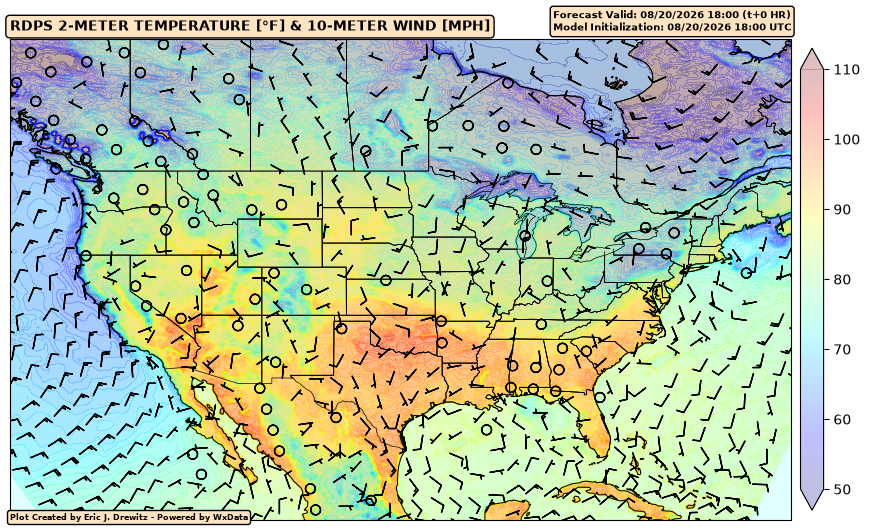

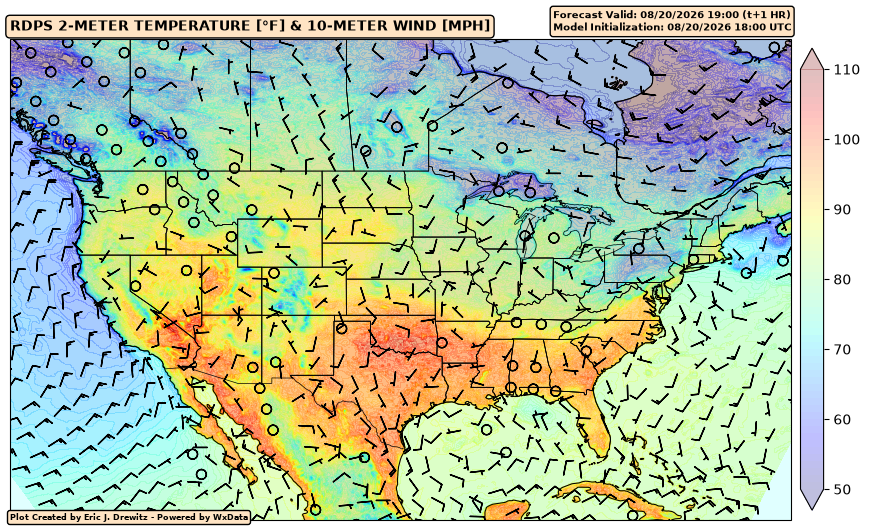

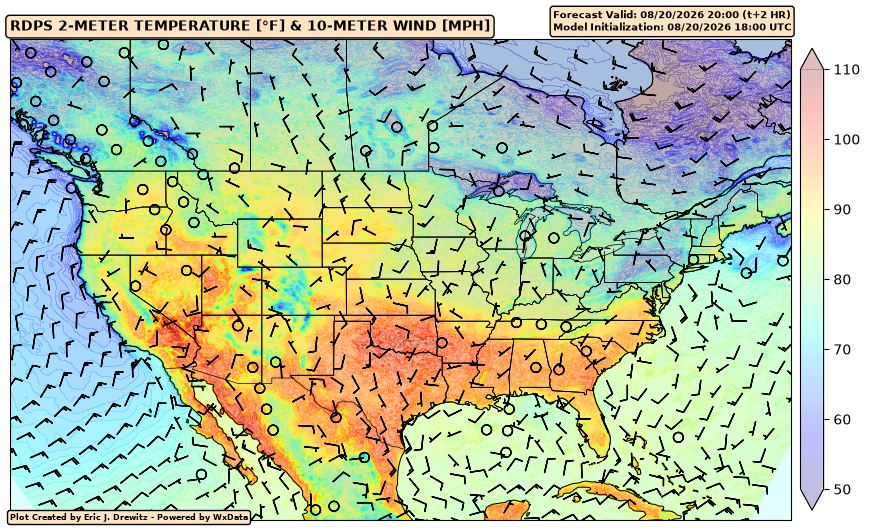

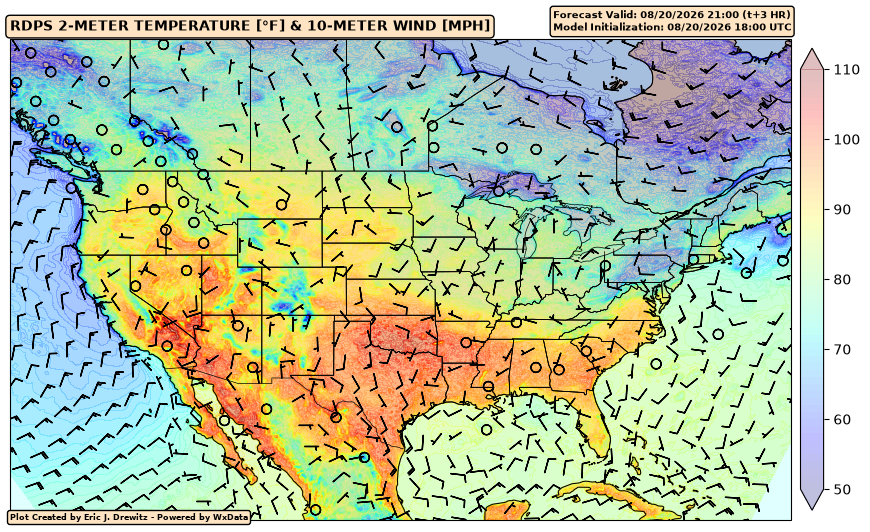

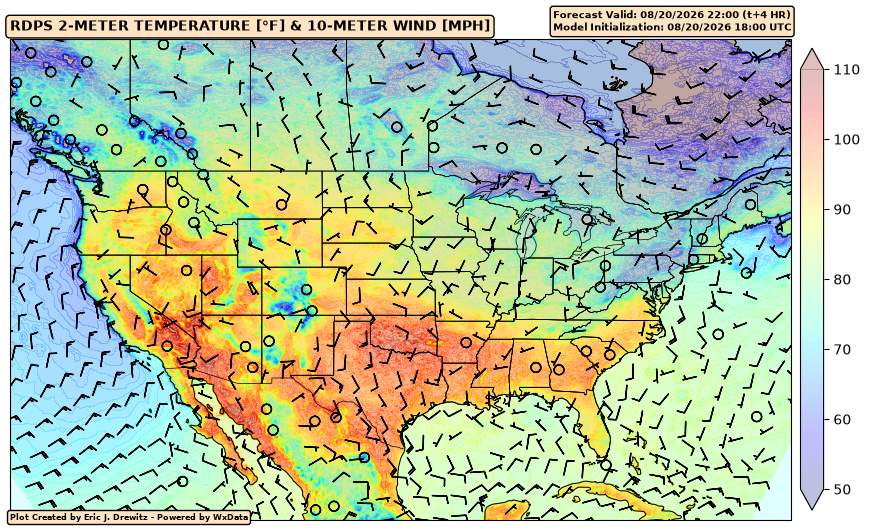

...

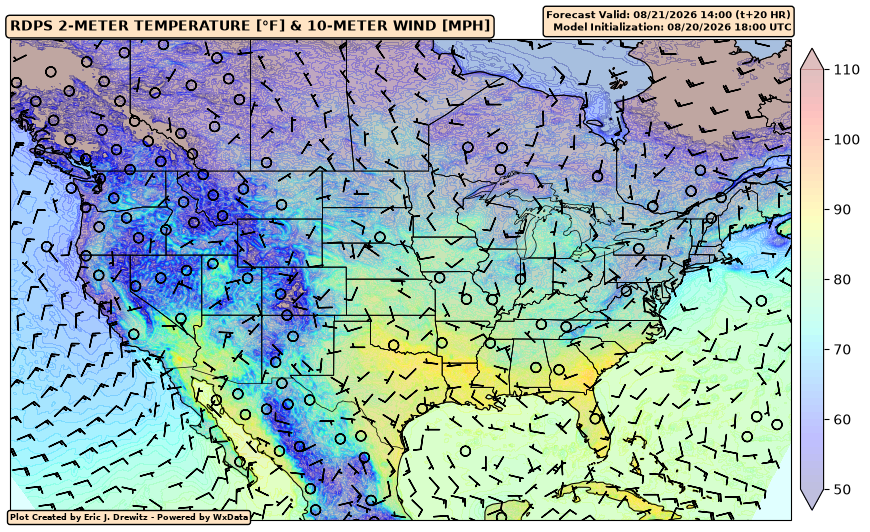

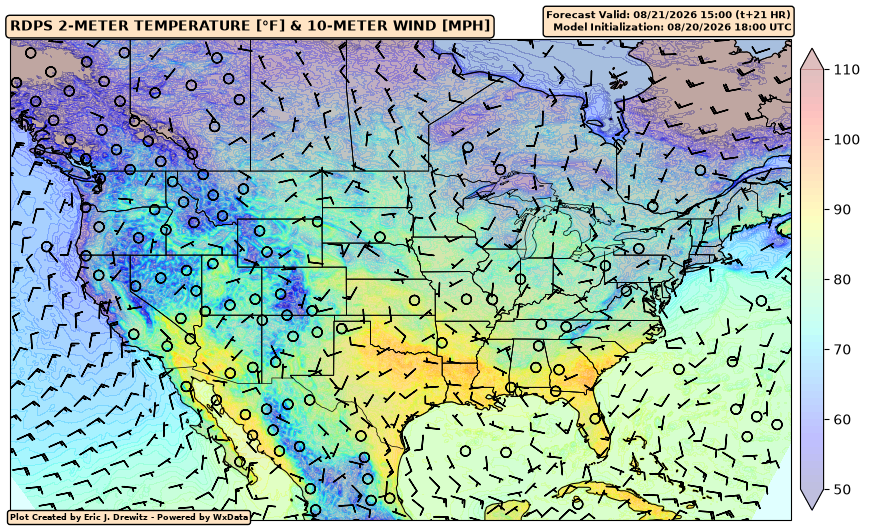

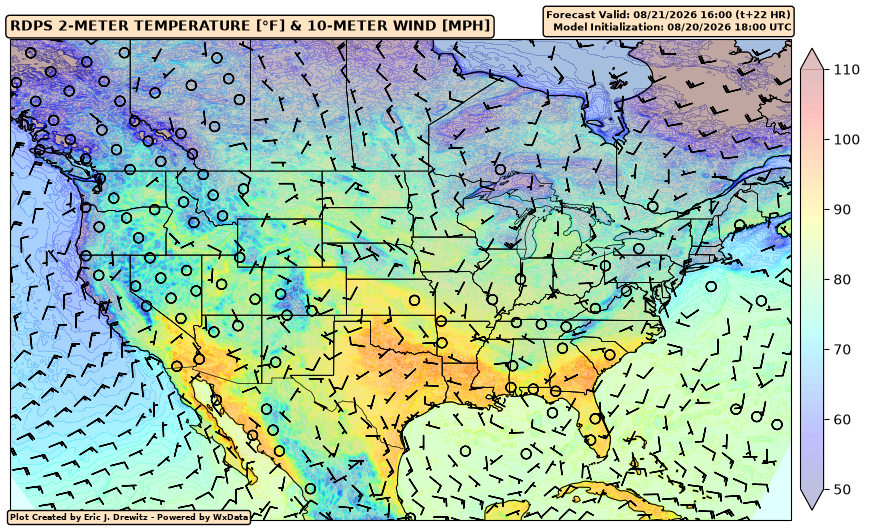

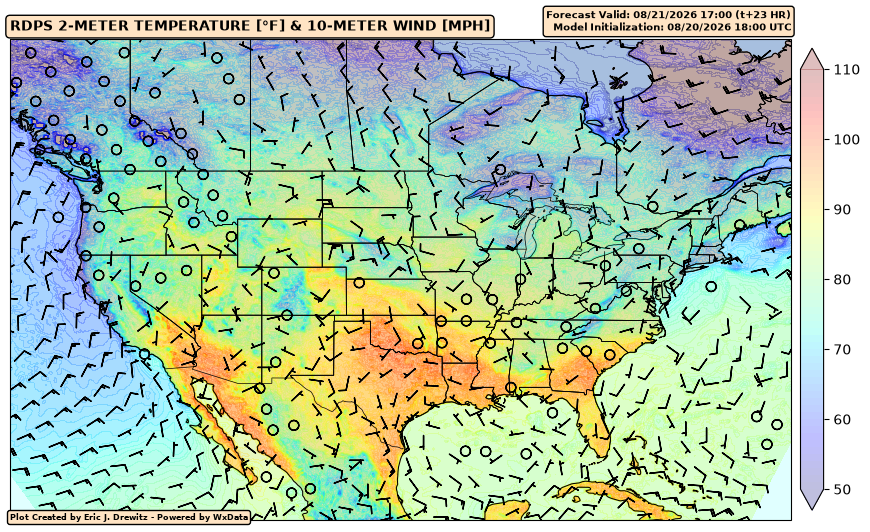

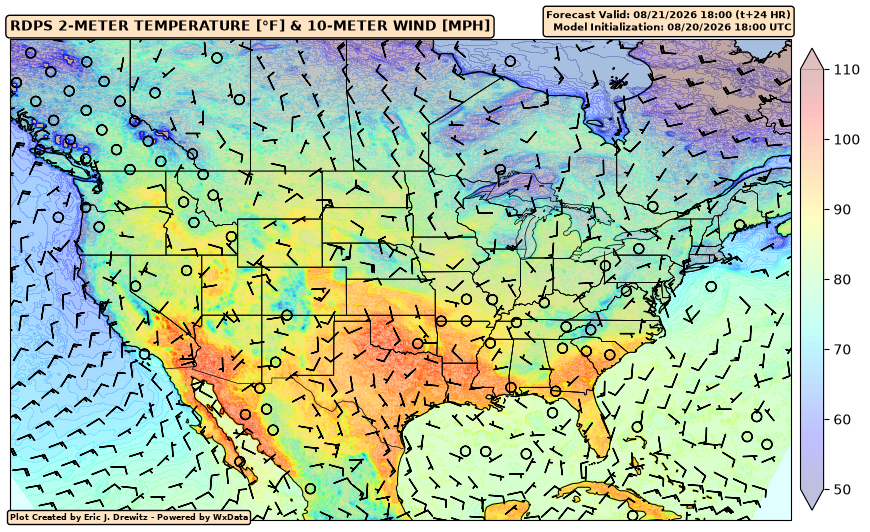

In [8]:
# Create our figure
for i in range(0, len(temperature['step']), 1):
    fig = plt.figure(figsize=(12,12))
    
    # Create our subplot with a PlateCarree (lat/lon) projection
    ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
    
    # Set our boundaries in a latlon format of [western_bound, eastern_bound, southern_bound, northern_bound] followed by our PlateCarree projection
    ax.set_extent([-130, -65, 20, 60], ccrs.PlateCarree())
    
    # Add our features to the map 
    # Add our coastlines
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.75, zorder=3)
    
    # Add the oceans, land, states, lakes and Canadian provinces and color them light cyan
    ax.add_feature(cfeature.OCEAN, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAKES, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAND, color='navajowhite', zorder=1)
    ax.add_feature(cfeature.STATES, edgecolor='black', linewidth=0.5, zorder=5)
    province_boundaries = cfeature.NaturalEarthFeature(
        category="cultural",
        name="admin_1_states_provinces_lines",
        scale="50m",
        facecolor="none",
        edgecolor="black",
    )
    ax.add_feature(province_boundaries, linewidth=0.5, zorder=5)
    
    # Add our filled contours for temperature
    cs = ax.contourf(temperature['longitude'], 
                   temperature['latitude'], 
                   temperature['temperature'][i, :, :], 
                   levels=np.arange(50, 111, 1), 
                   transform=ccrs.PlateCarree(),
                   alpha=0.25,
                   cmap='jet',
                   extend='both')
    
    # Create our colorbar for our filled contours
    fig.colorbar(cs, 
                 shrink=0.5, 
                 pad=0.01,
                 ticks=np.arange(50, 120, 10))
    
    # Get our filtered latitude and longitude values to plot our wind barbs
    # Gets the value for u and v every 20 data points
    u = (u_wind['u-component_of_wind'][i, ::20, ::20].to_dataframe())
    v = (v_wind['v-component_of_wind'][i, ::20, ::20].to_dataframe())
    
    # Create our wind barbs
    barbs = mpplots.StationPlot(ax, u['longitude'], u['latitude'],
                                    transform=ccrs.PlateCarree(), 
                                    clip_on=True)
    
    # Filter our u and v wind components to the same decimation as our barbs & convert from m/s to mph
    
    # Plot our wind barbs and converts m/s to mph
    barbs.plot_barb(u['u-component_of_wind'] * 2.23694, 
                  v['v-component_of_wind'] * 2.23694,
                  color='black',
                  length=4.5)
    
    # Plot title
    plt.title(f"RDPS 2-METER TEMPERATURE [°F] & 10-METER WIND [MPH]", 
                   fontsize=10, 
                   fontweight='bold',
                   bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                   loc='left')
    
    # Extract our valid time as a datetime object
    valid_time = pd.to_datetime(temperature['valid_time'].values)
    
    # Gets our new forecast hour (eventhough we are plotting the initial frame)
    times = temperature['step'].values
    forecast_time = valid_time + timedelta(hours=int(times[i]))
    
    # Secondary title for our model runtime
    plt.title(f"Forecast Valid: {forecast_time.strftime('%m/%d/%Y %H:00')} (t+{int(times[i])} HR)\nModel Initialization: {valid_time.strftime('%m/%d/%Y %H:00')} UTC", 
                    fontsize=7, 
                    fontweight='bold',
                    bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                    loc='right')
    
    # Adding my signature on the plot
    ax.text(0, 
            -0.001, 
            f"Plot Created by Eric J. Drewitz - Powered by WxData", 
            transform=ax.transAxes, 
            fontsize=6, 
            fontweight='bold', 
            bbox=dict(boxstyle='round', 
                    facecolor='bisque'))

    plt.show()